In [18]:
import matplotlib.pyplot as plt
from collections import Counter
import pickle
import pandas as pd
import seaborn as sn
import string 

%matplotlib inline
%pylab inline
pylab.rcParams['figure.figsize'] = (15, 6)

def print_result(d):
    a = dict([(k, pd.Series([d[k]])) for k in d.keys()])
    pandas = pd.DataFrame(a)
    display(pandas)
    
    
def conf_matrix(array, title, xSize = 10, ySize = 7): 
    
    df_cm = pd.DataFrame(array, index = [i for i in string.ascii_uppercase[:len(array)]],
                      columns = [i for i in string.ascii_uppercase[:len(array)]])
    plt.figure(figsize = (xSize,ySize))
    sn.heatmap(df_cm, annot=True, fmt = '.2')
    plt.title(title)


Populating the interactive namespace from numpy and matplotlib


In [108]:
OUTPUT_DIRECTORY = '../outputToyData_NofNetwork_4/'
years = [2016]
months = [[1,2,3],[4,5,6],[7,8,9],[10,11,12]]
NUMBER_OF_COMMUNITIES = 10 #How many community to analyze

In [109]:
for y in years:
    for m_index, m_list in enumerate(months):
        infoDict = pickle.load(open(OUTPUT_DIRECTORY+ str(y)+'_'+str(m_index)+'_info.pickle'))
        print 'Network Statistics For Year: ', y, ' Month: ', m_index
        print_result(infoDict)
        print '------------------------------------------------'

Network Statistics For Year:  2016  Month:  0


,nOfEdges,nOfNodes
0,27712,54611


------------------------------------------------
Network Statistics For Year:  2016  Month:  1


,nOfEdges,nOfNodes
0,27522,54320


------------------------------------------------
Network Statistics For Year:  2016  Month:  2


,nOfEdges,nOfNodes
0,27028,53332


------------------------------------------------
Network Statistics For Year:  2016  Month:  3


,nOfEdges,nOfNodes
0,20127,39796


------------------------------------------------


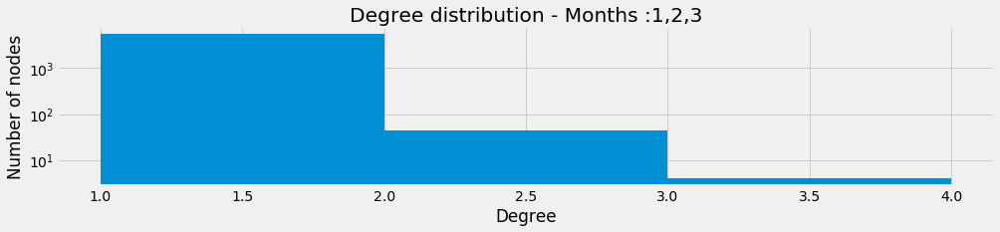

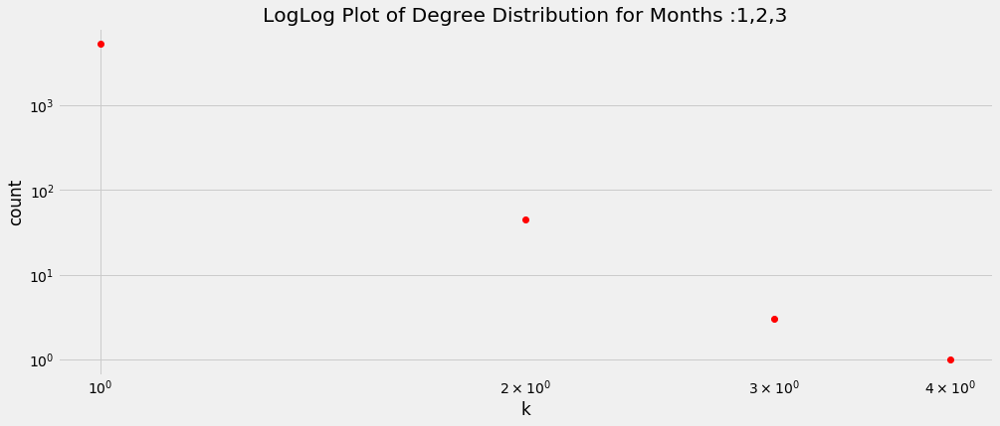

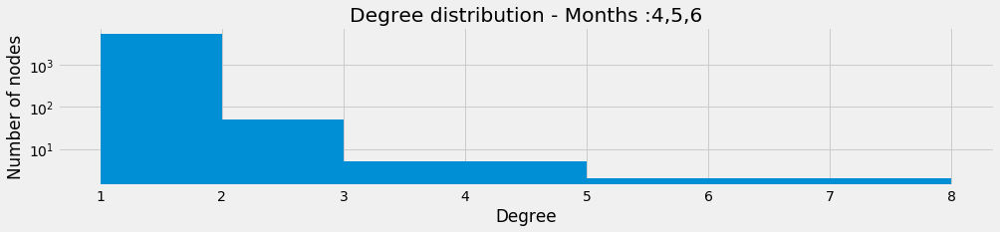

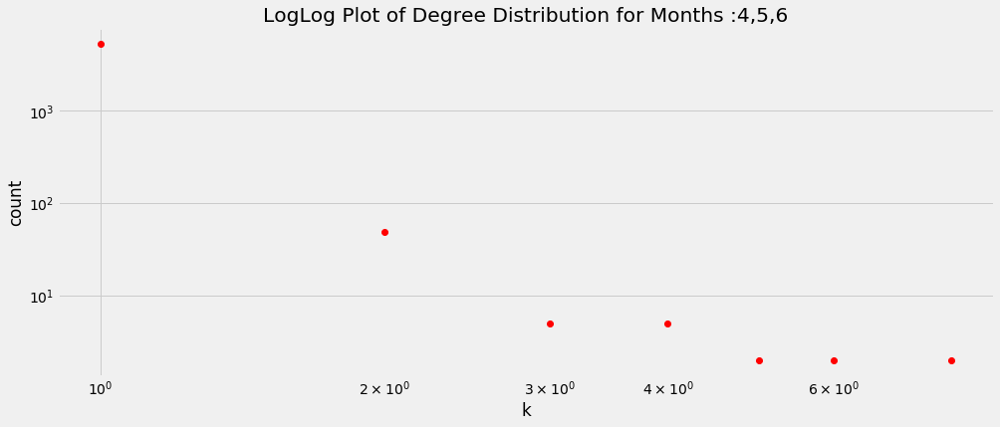

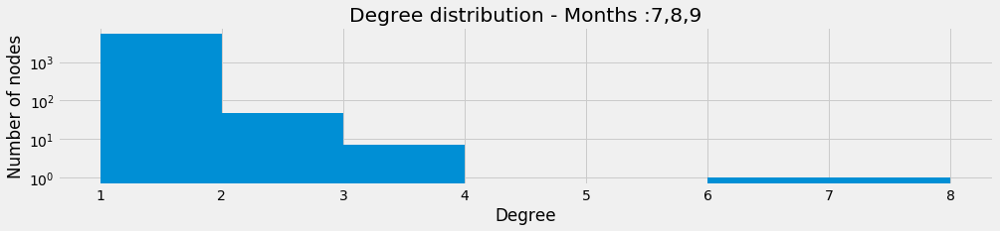

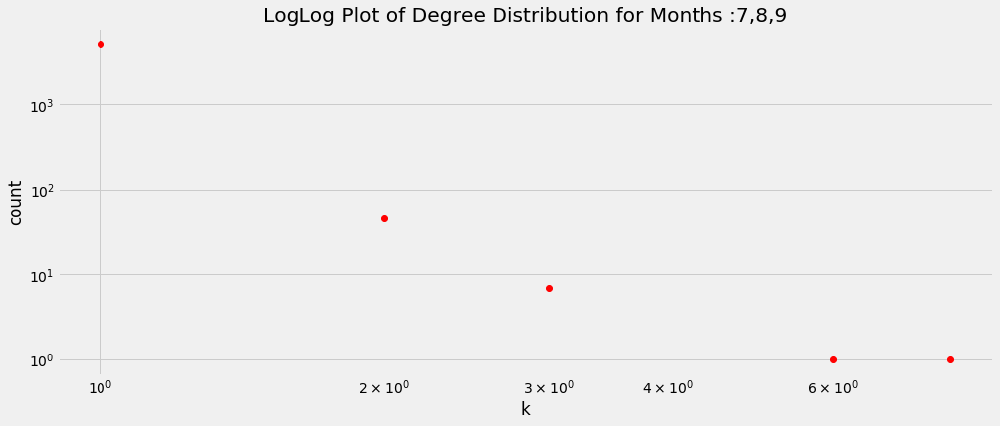

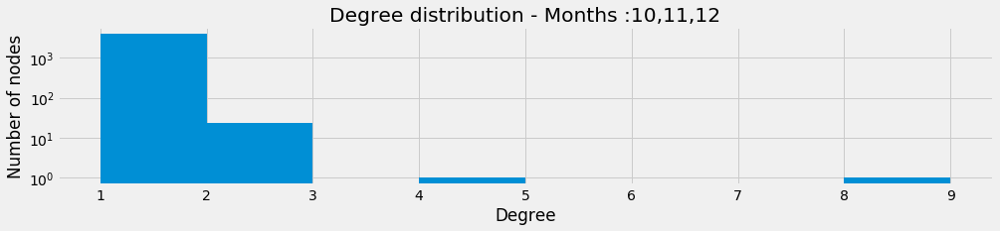

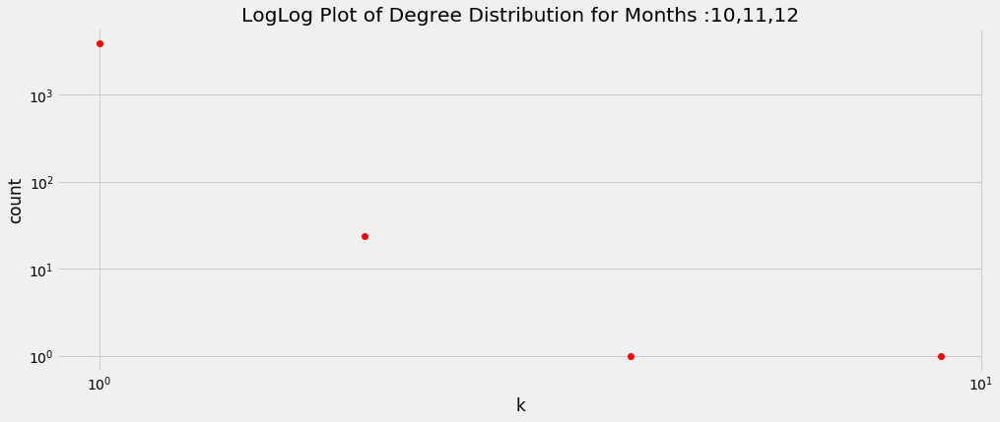

In [119]:
import random
for y in years:
    for m_index, m_list in enumerate(months):
        degreeDict = pickle.load(open(OUTPUT_DIRECTORY+ str(y)+'_'+str(m_index)+'_degree.pickle'))
        
        plt.style.use('fivethirtyeight')
        # get minumum and maximum degrees
        min_degree, max_degree = min(degreeDict.values()), max(degreeDict.values())
        # plot the degree distributions
        plt.figure()
        plt.subplot(211)
        plt.yscale('log', nonposy='clip')
        plt.title('Degree distribution - Months :'  + ','.join(str(m) for m in m_list))
        plt.xlabel('Degree')
        plt.ylabel('Number of nodes')
        d = sorted(degreeDict.values(),reverse=True)
        r = range(min_degree, max_degree + 1)
        _ = plt.hist(d,r) # degree sequence
        
        c = Counter(d)
        frequency = c.values()
        degrees_values = c.keys()
        plt.figure()
        plt.loglog(degrees_values, frequency, 'ro')
        plt.xlabel('k')
        plt.ylabel('count')
        plt.title('LogLog Plot of Degree Distribution for Months :'  + ','.join(str(m) for m in m_list))
        plt.show()

# Matrix showing similarity between each months graph

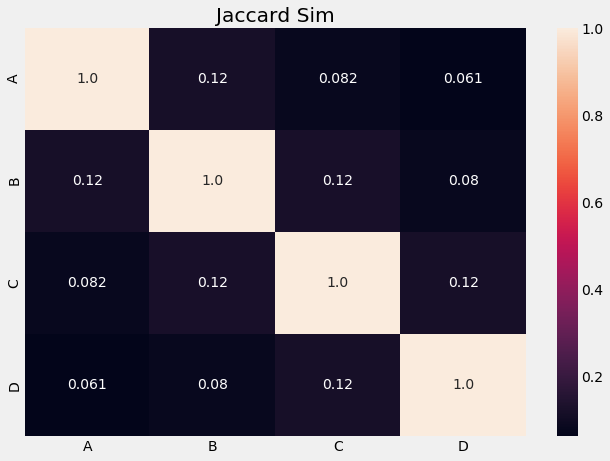

In [22]:
import cPickle as pickle
monthSimilarityMatrix = pickle.load(open(OUTPUT_DIRECTORY+ 'jaccardYearly.cPickle'))
conf_matrix(monthSimilarityMatrix,'Jaccard Sim')

In [23]:
consecutiveMonthsJaccardDict50 = pickle.load(open(OUTPUT_DIRECTORY+ 'JACCARD_DICT_50.cPickle'))

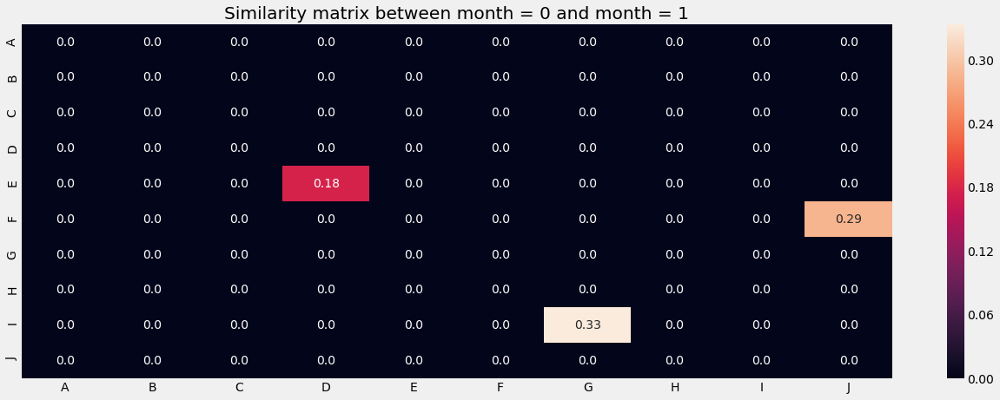

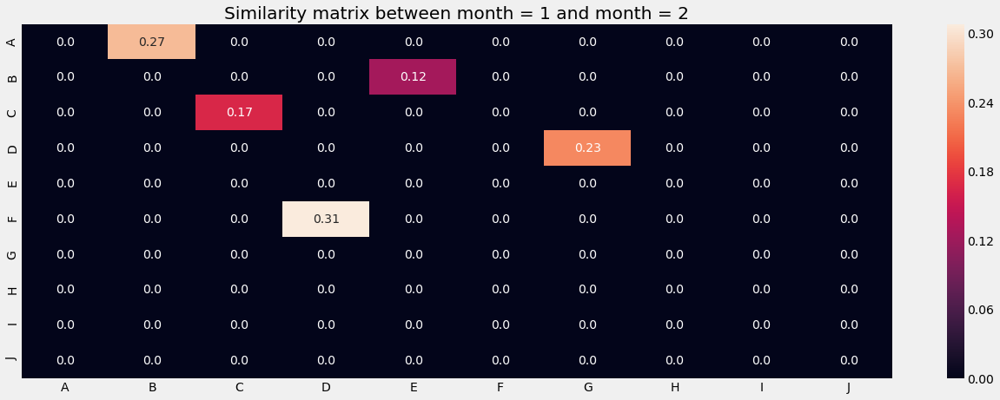

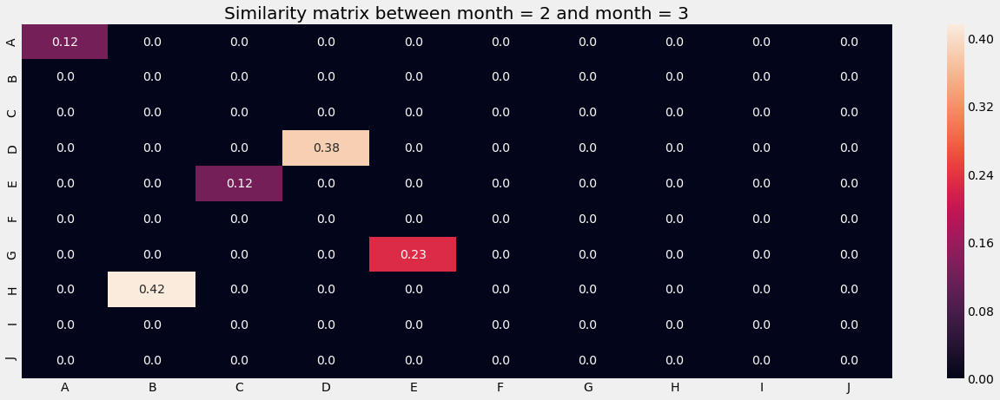

In [24]:
for i in consecutiveMonthsJaccardDict20:
    t = 'Similarity matrix between month = {} and month = {}'.format(i,i+1)
    conf_matrix(consecutiveMonthsJaccardDict50[i][:NUMBER_OF_COMMUNITIES,:NUMBER_OF_COMMUNITIES], t, 20,7)

# WORDCLOUD for every community we have

In [104]:
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import urllib, cStringIO
import cPickle as pickle
import arabic_reshaper
import matplotlib.pyplot as plt
from bidi.algorithm import get_display
import jieba
import textblob as txb



def getWordCloud(text, m, c, name):
    text = text[:500]
    b = txb.TextBlob(text)
    lang =  b.detect_language()
    print lang
     
        
        
    # # plot it.
    a = plt.figure()
    
    if(lang == 'ar'):
        try:
            text = arabic_reshaper.reshape(text)
            allWords = text.split()
            text = ""
            for mmm in allWords:
                try:
                    text += get_display(mmm) + " "
                except:
                    text += mmm + " "
#             text = get_display(text)
            word_cloud = WordCloud(font_path='arabtype.ttf',width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
    
        except:
            word_cloud = WordCloud(width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
              
    elif lang == 'ja':
        word_cloud = WordCloud(font_path='SourceHanSerifK-Light.otf').generate(text)
        
    else: 
        word_cloud = WordCloud(width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
    
    
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.title('M = ' + str(m) + '/' + str(c))
    plt.axis("off")
    plt.show()
    a.savefig("../wordCloudImages/" +name+".png")
    


In [105]:
y = 2016
m = 1 
descDict = pickle.load(open(OUTPUT_DIRECTORY + str(y) + '_' + str(m) + '_userDescriptions_200.cPickle'))

In [106]:
len(descDict)

20

en


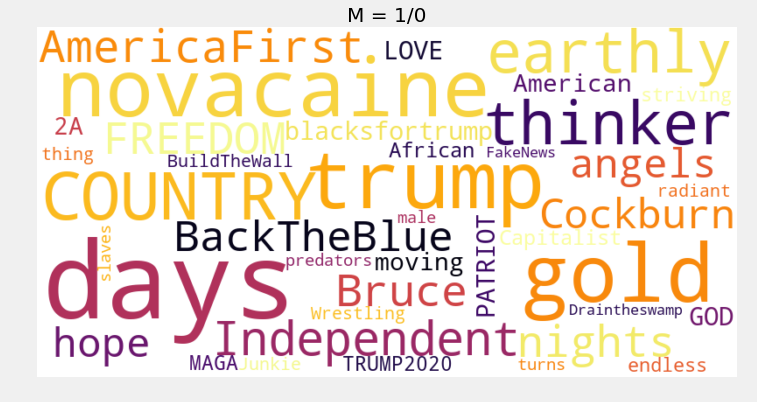

en


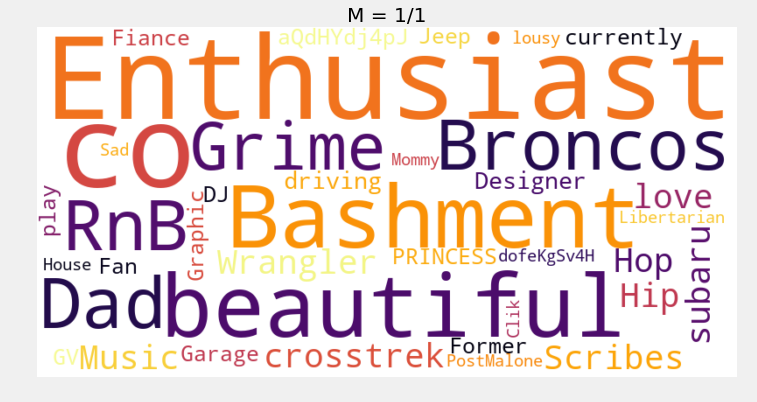

en


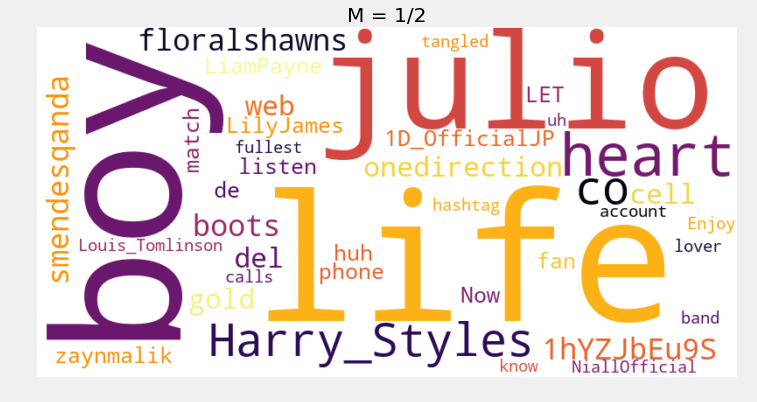

en


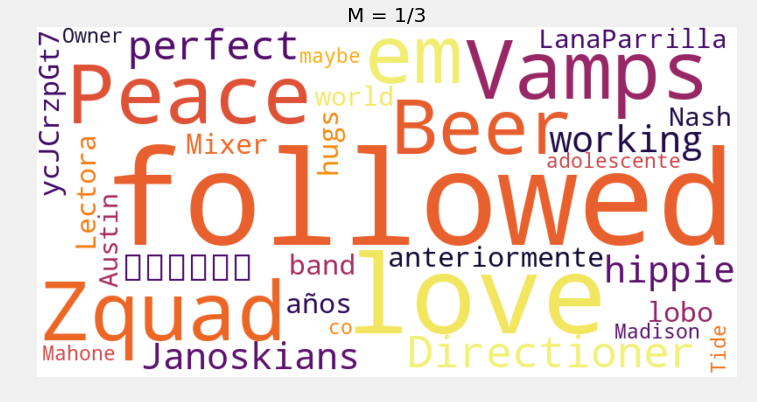

ar


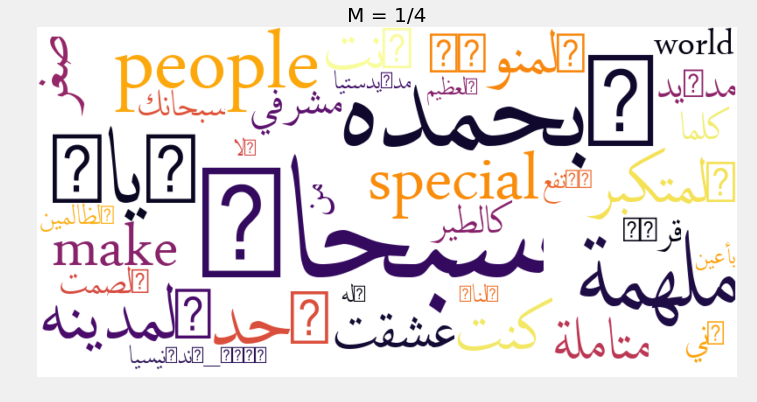

en


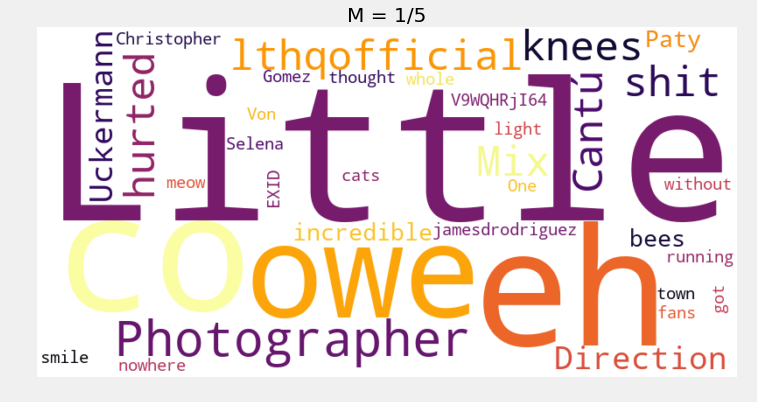

en


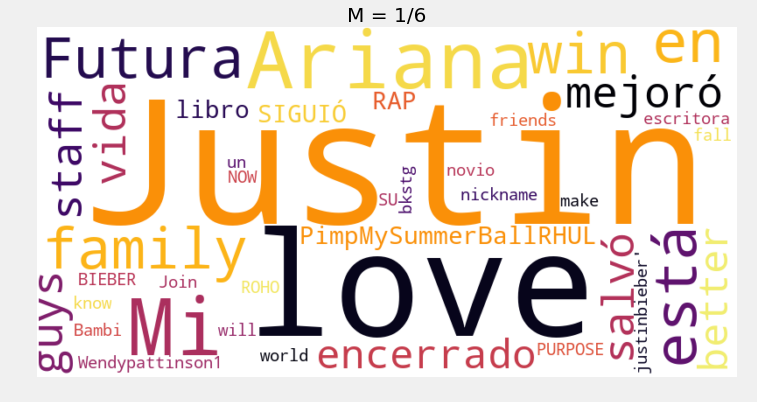

es


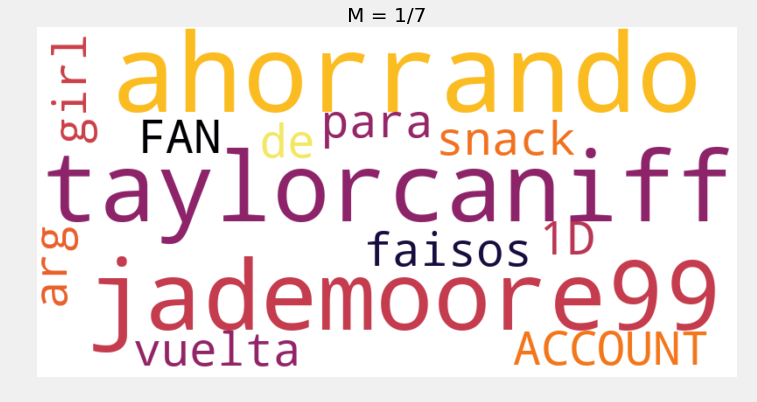

pt


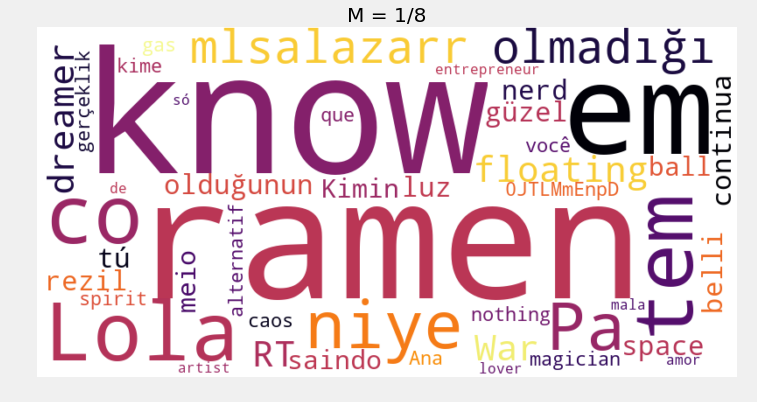

en


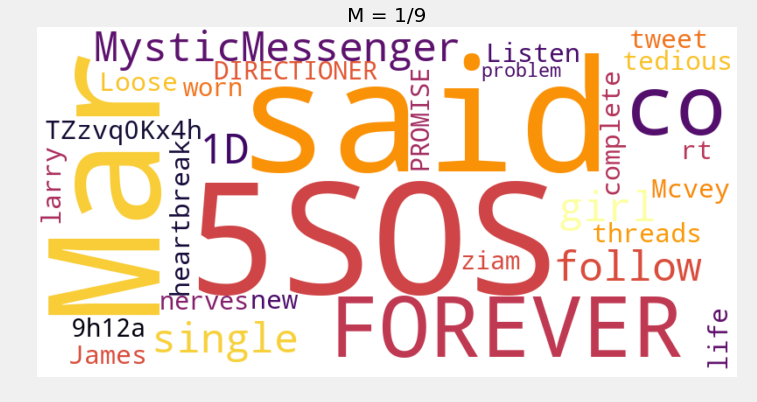

ar


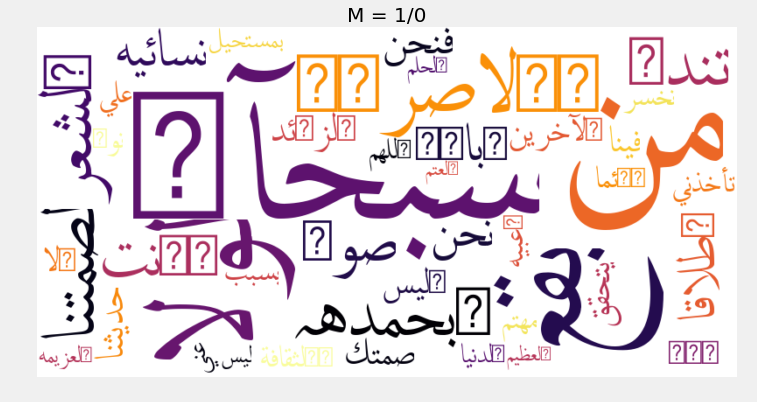

en


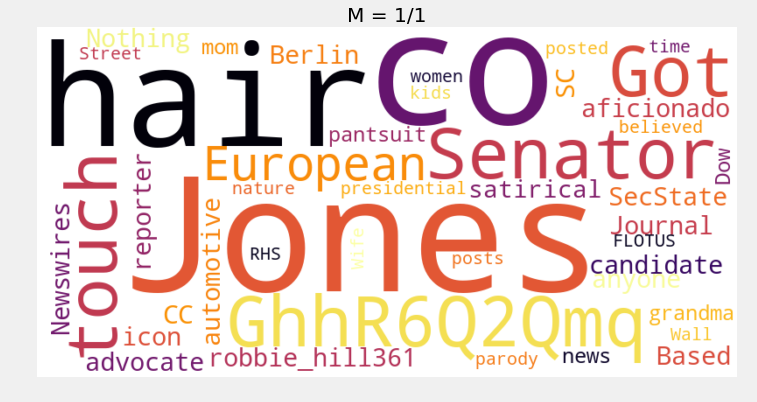

es


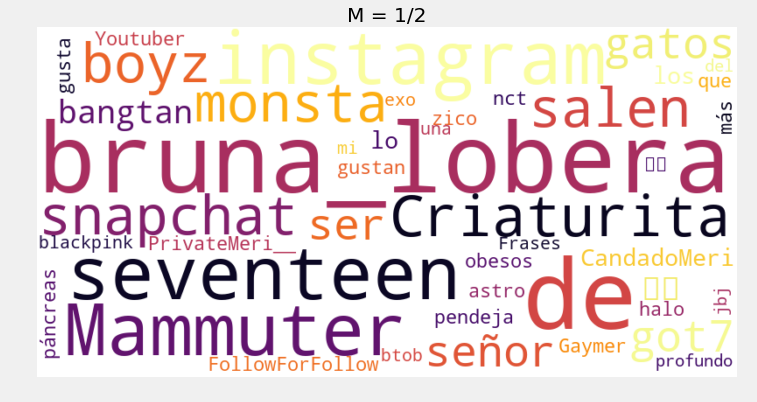

ar


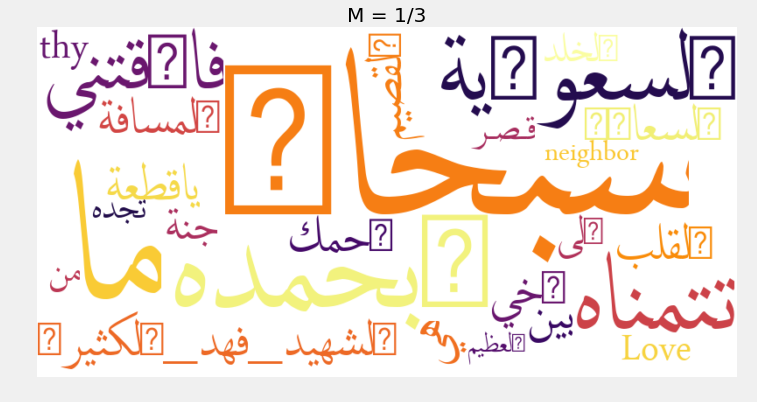

en


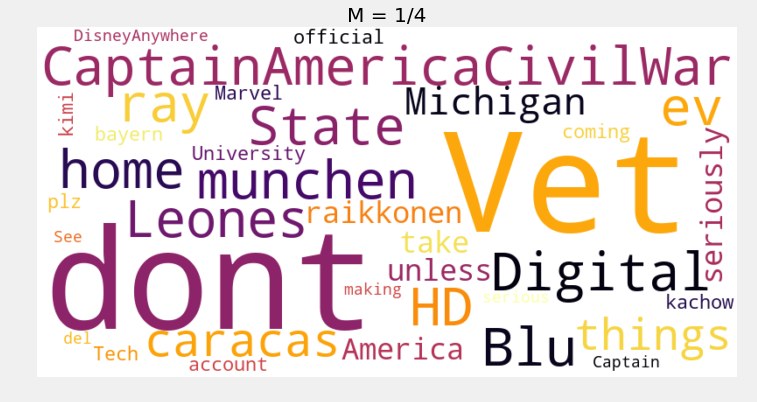

en


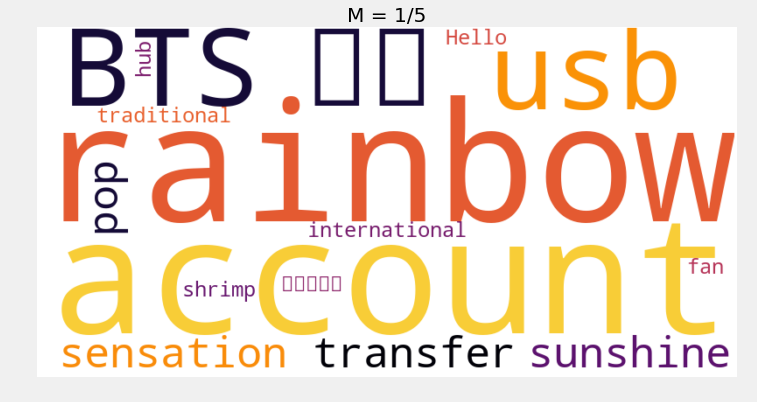

en


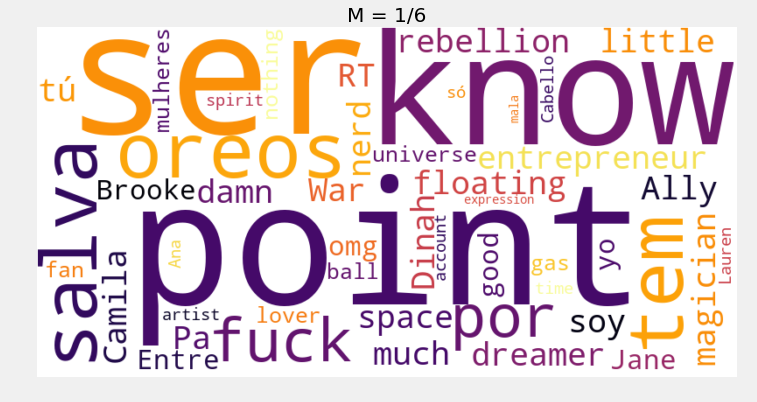

ko


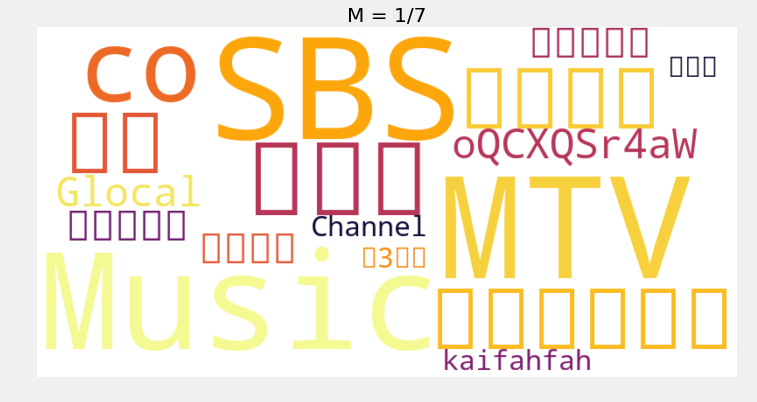

en


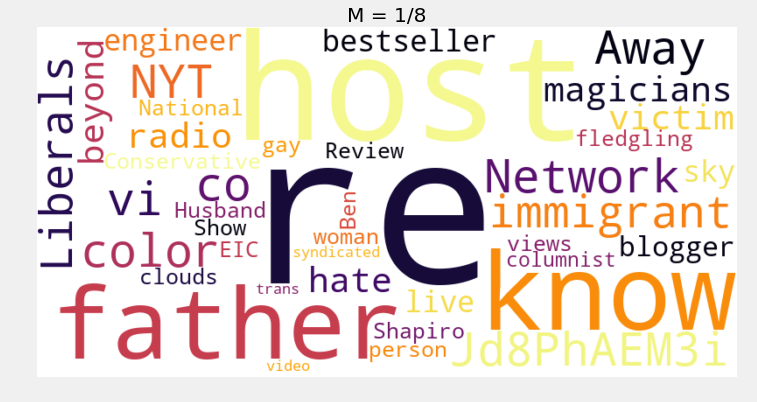

en


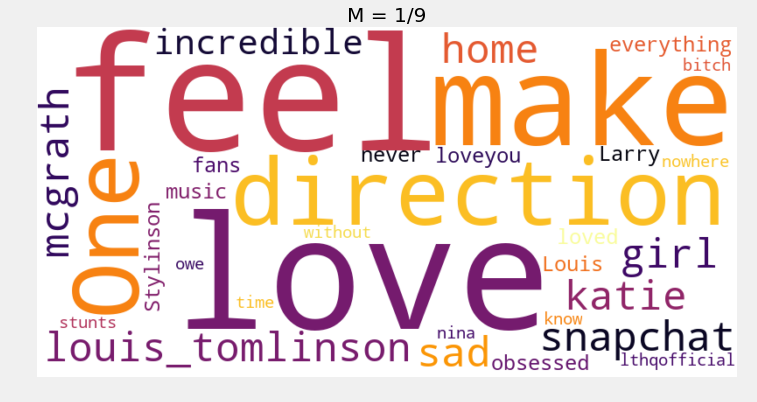

en


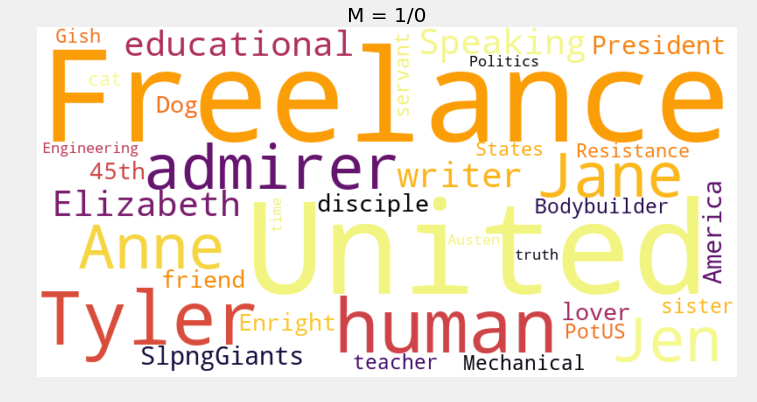

ar


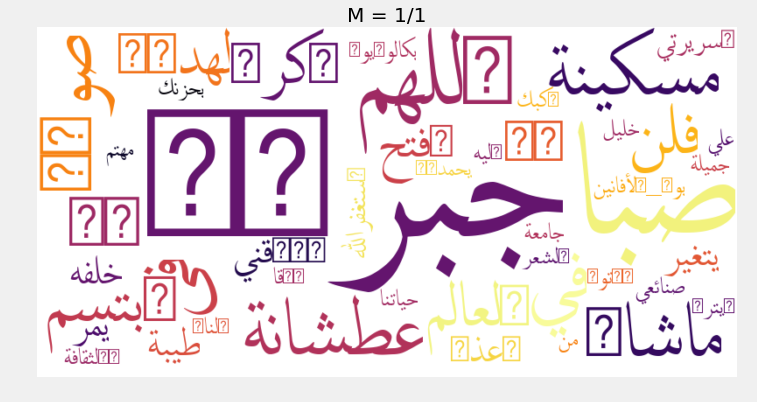

es


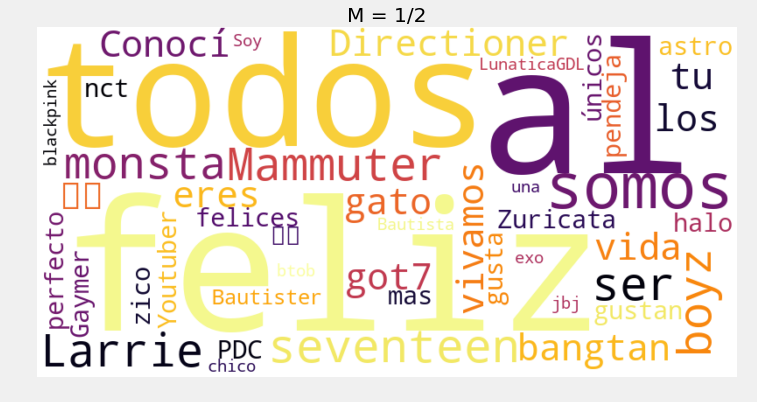

th


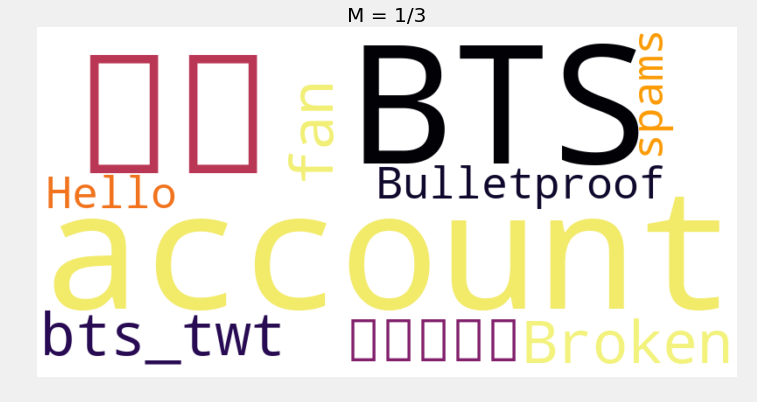

en


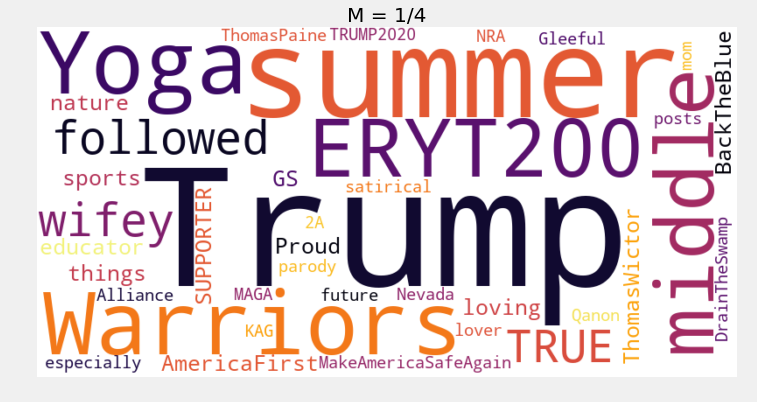

en


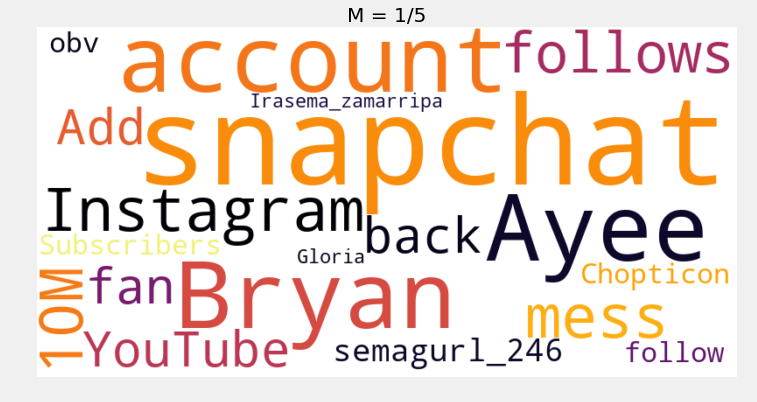

ar


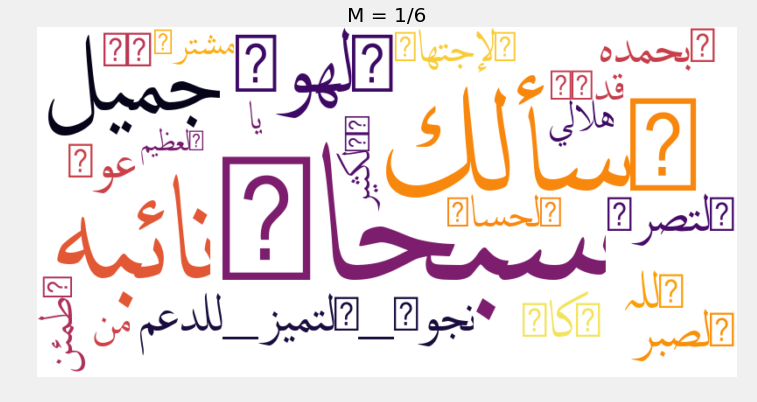

en


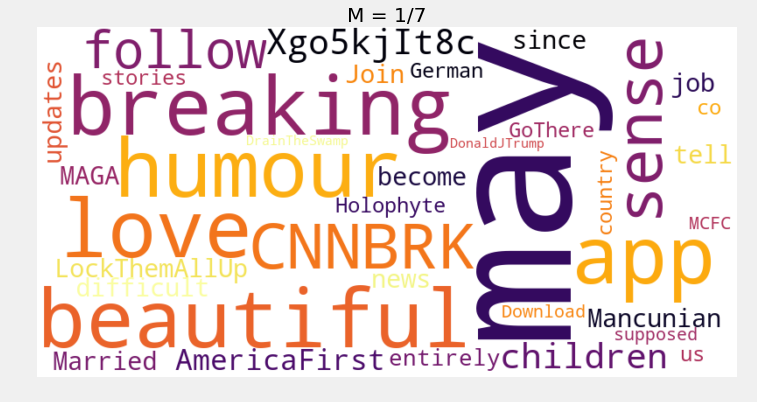

en


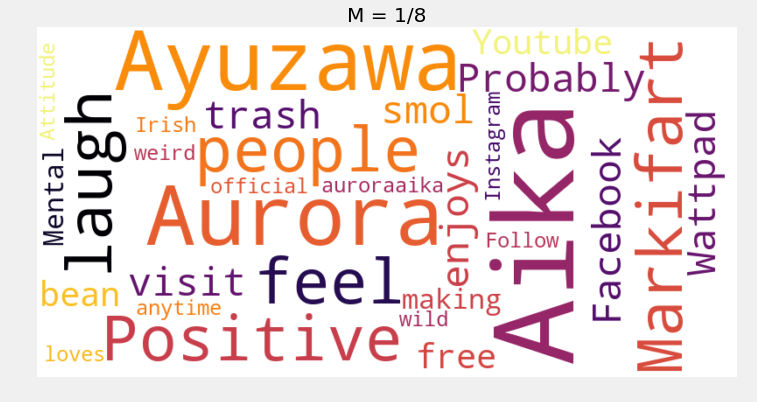

en


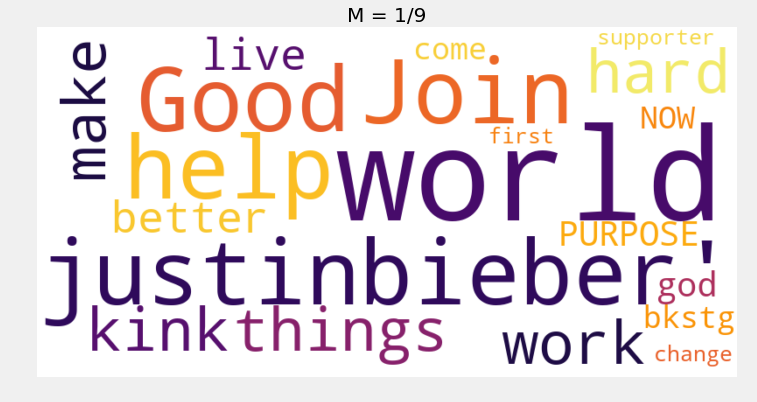

en


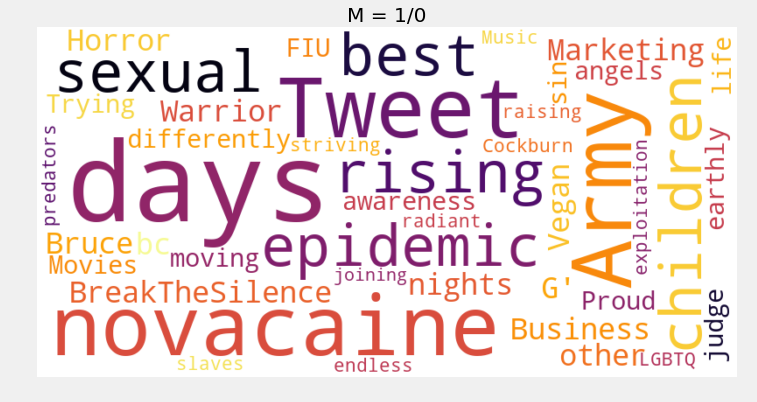

en


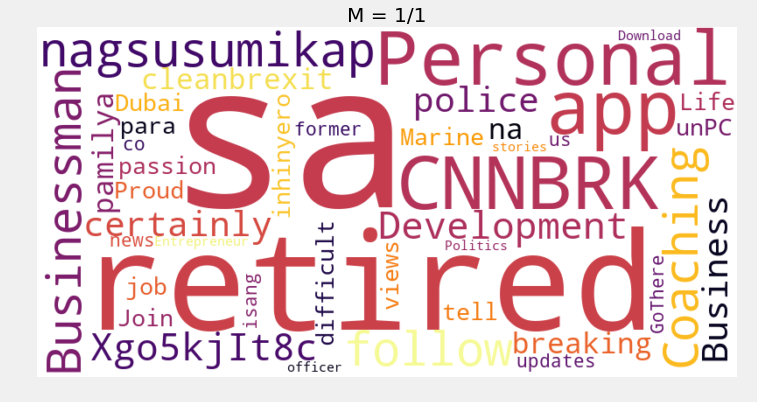

en


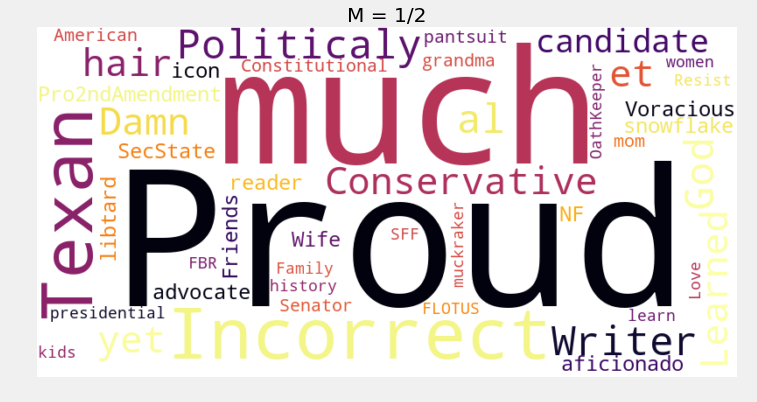

ja


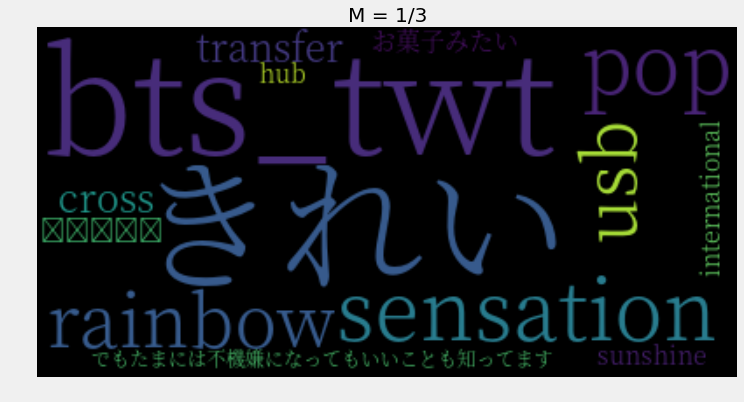

ar


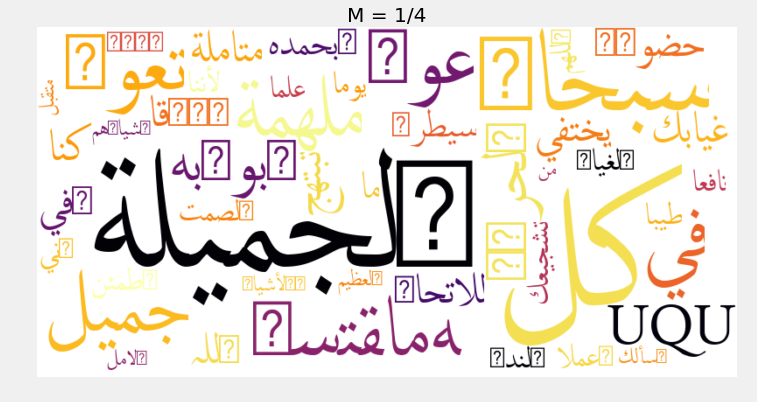

en


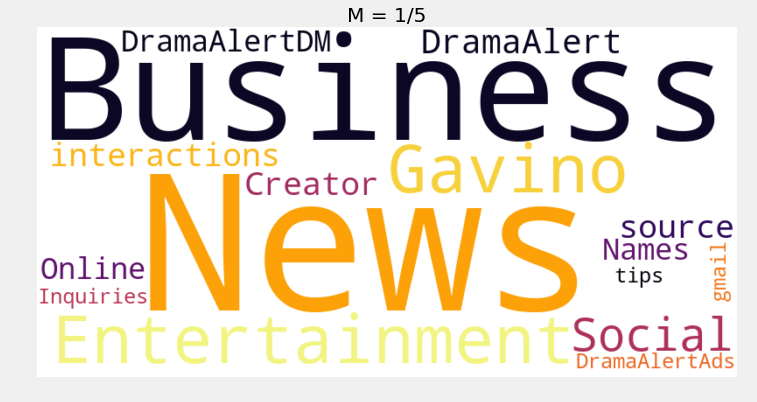

en


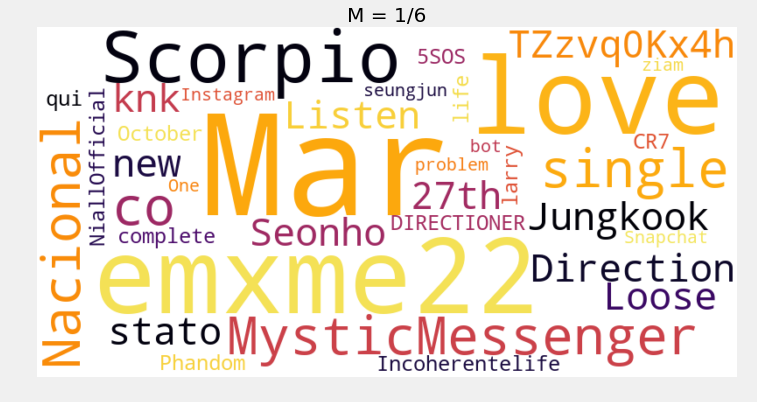

en


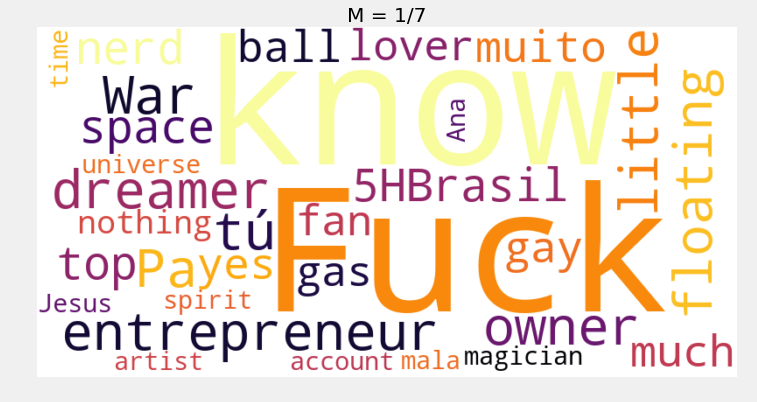

en


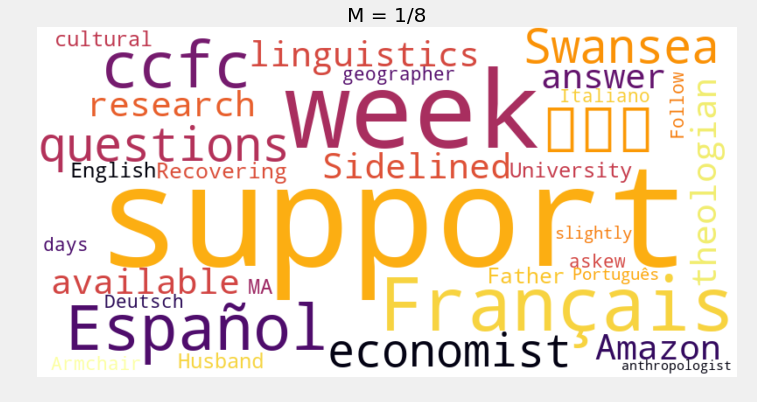

en


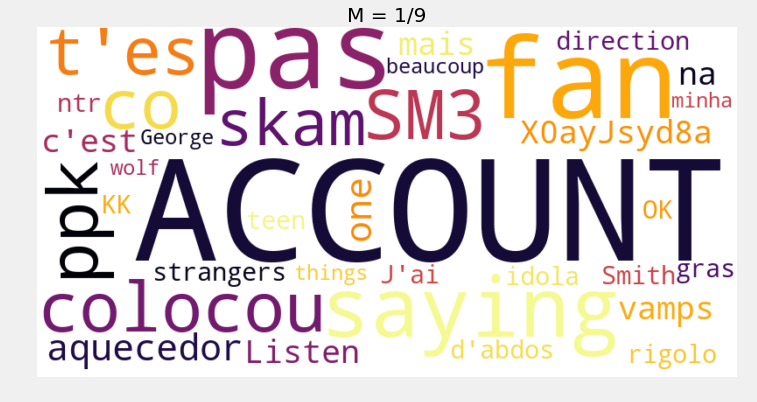

In [107]:
image_path = cStringIO.StringIO(urllib.urlopen('https://i.imgur.com/kftApxC.png').read())
texas_mask = np.array(Image.open(image_path))
# defining the wordcloud with stopwords and some edgy styling choices. 


STOPWORDS = STOPWORDS.union({'http','https','je','la','le','les'})
for m_index, m_list in enumerate(months):
    descDict = pickle.load(open(OUTPUT_DIRECTORY + str(y) + '_' + str(m_index) + '_userDescriptions_200.cPickle'))
    for c in range(NUMBER_OF_COMMUNITIES):
        text = descDict[c]
        getWordCloud(text,m,c, 'm_'+ str(m) + 'c_'+str(c) )

Lets do the same with tf-idf 

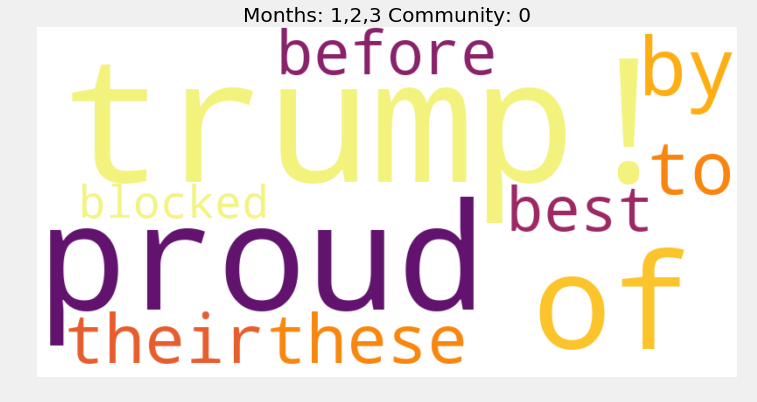

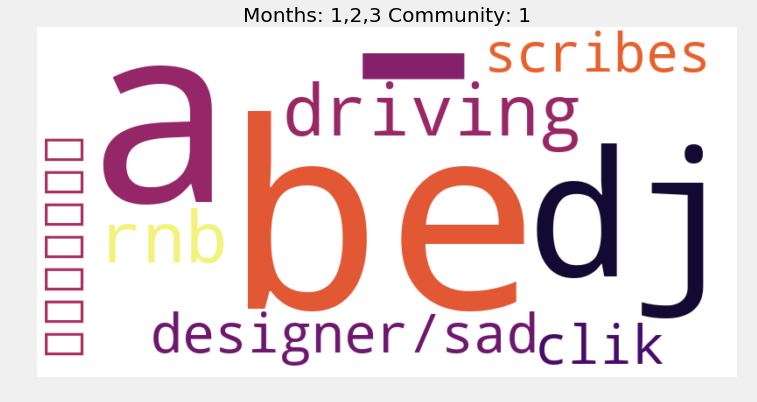

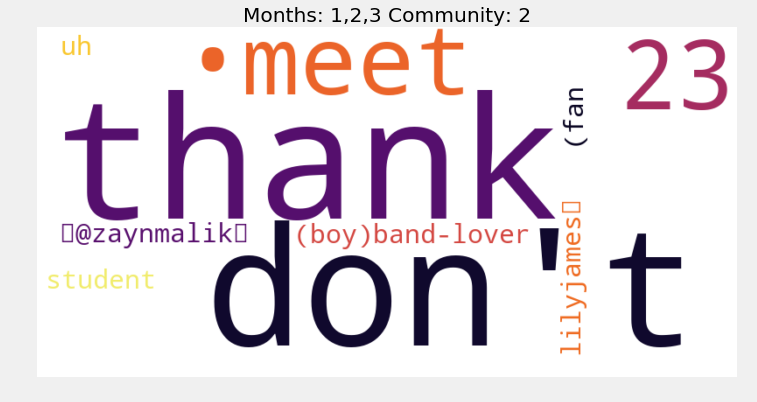

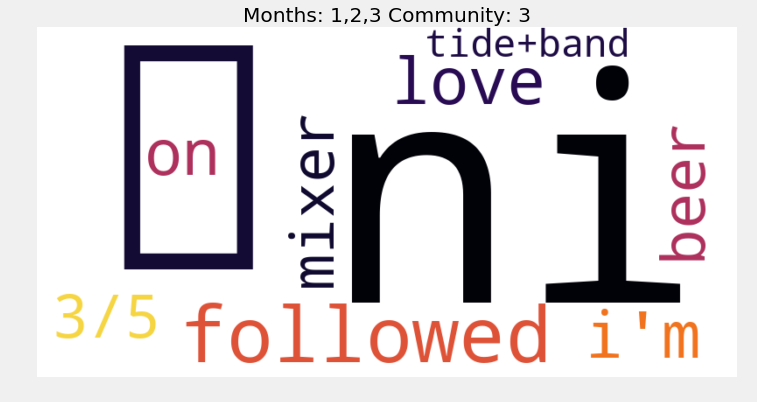

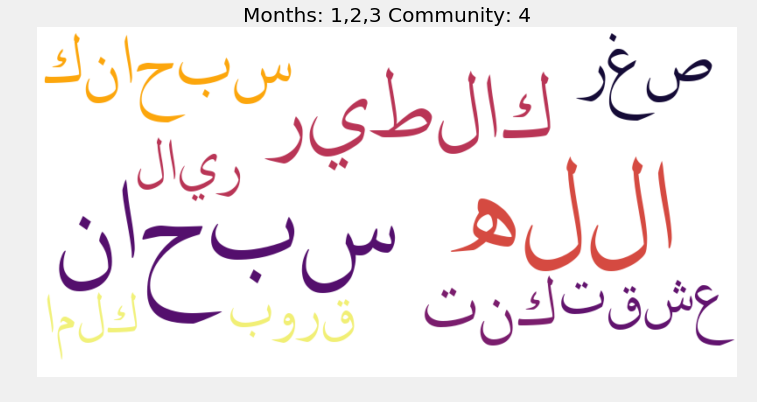

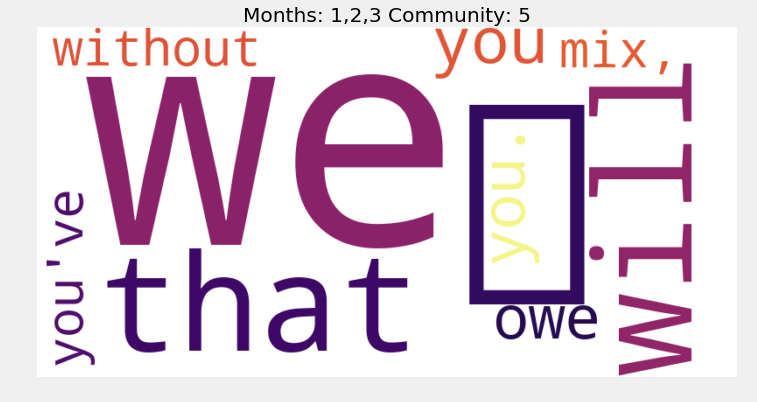

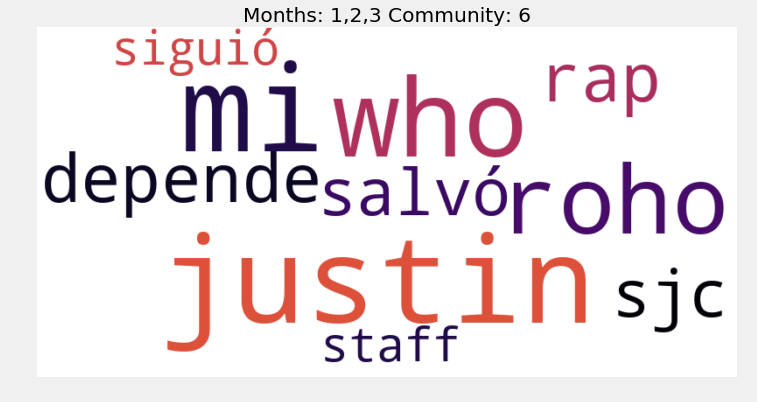

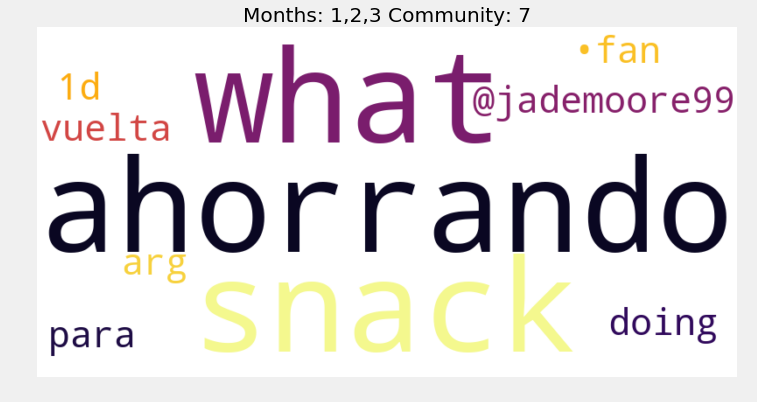

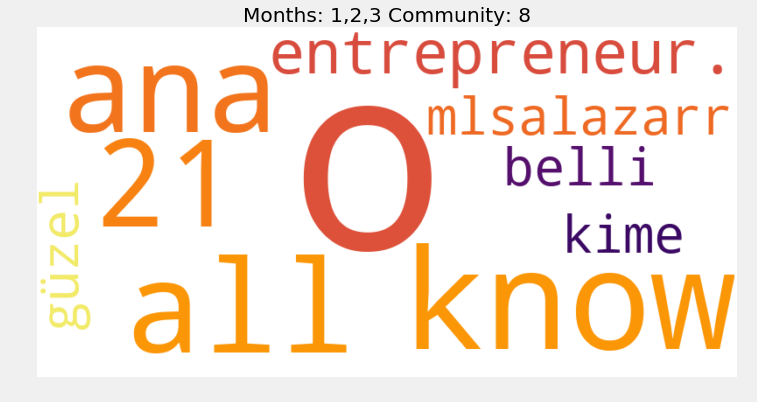

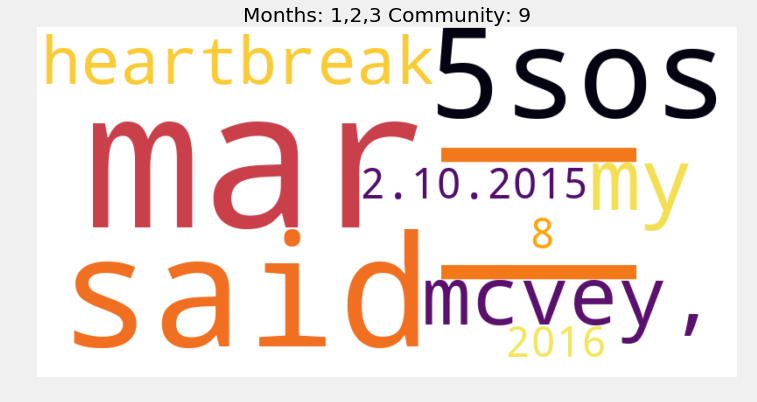

lol


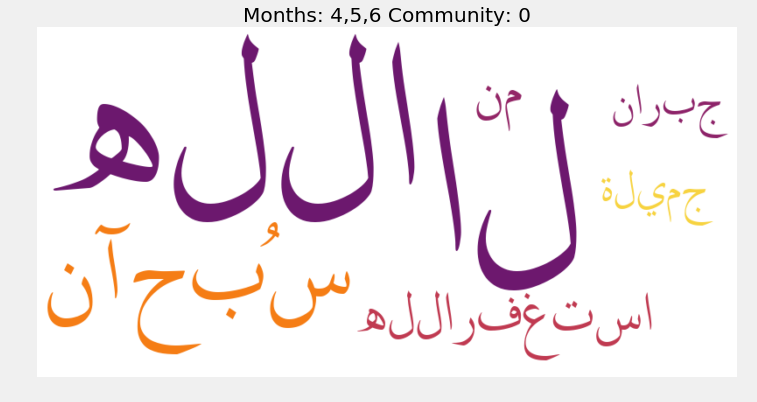

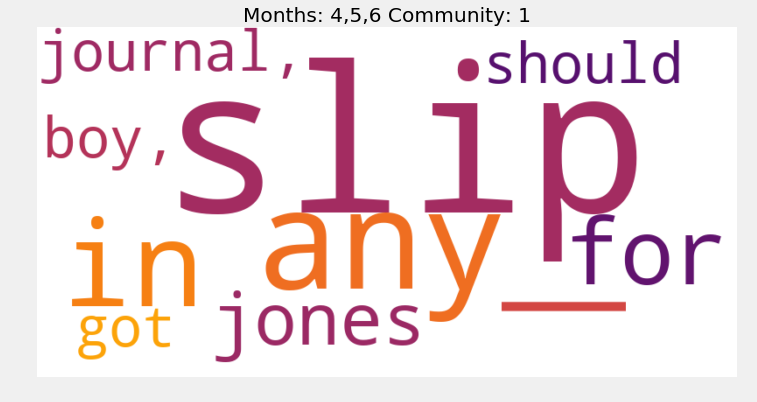

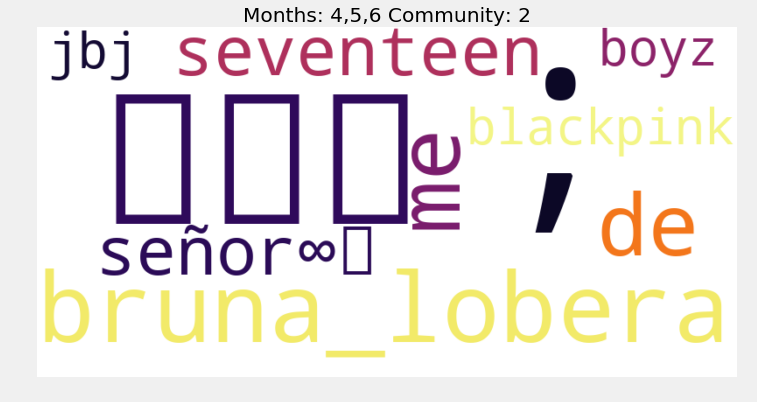

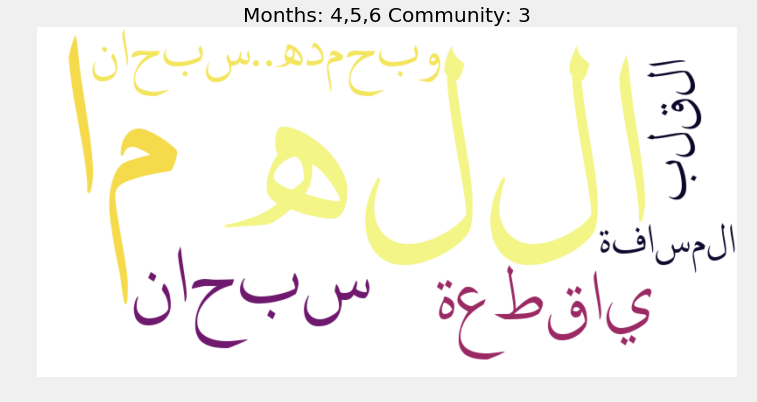

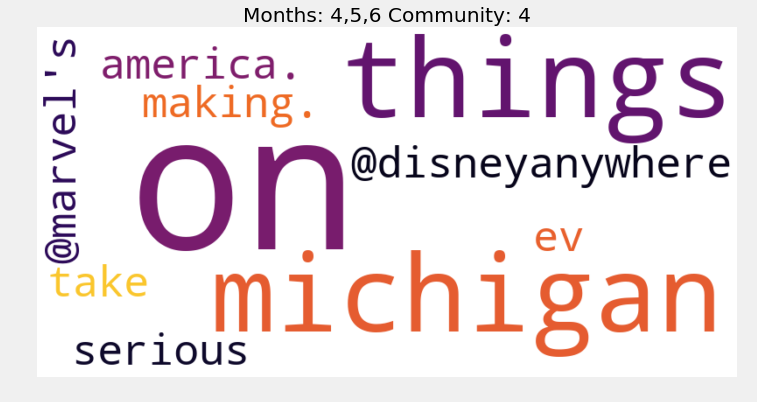

...

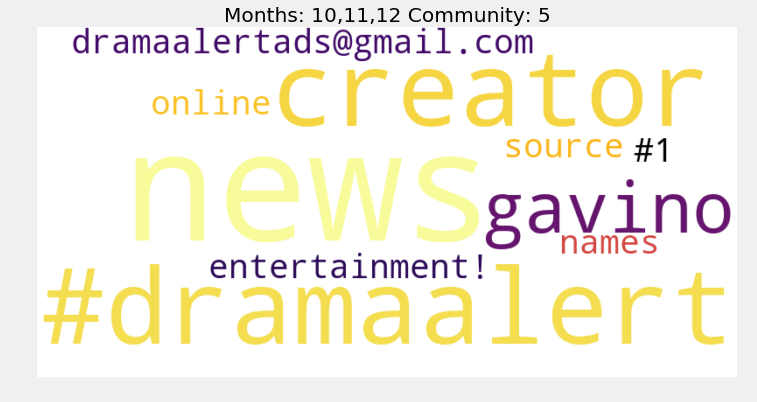

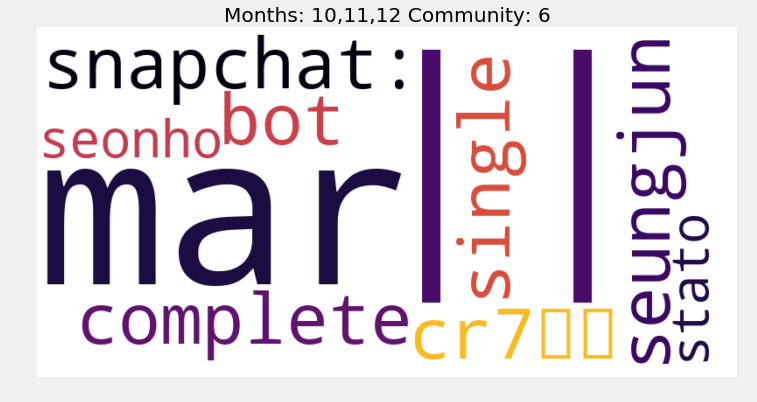

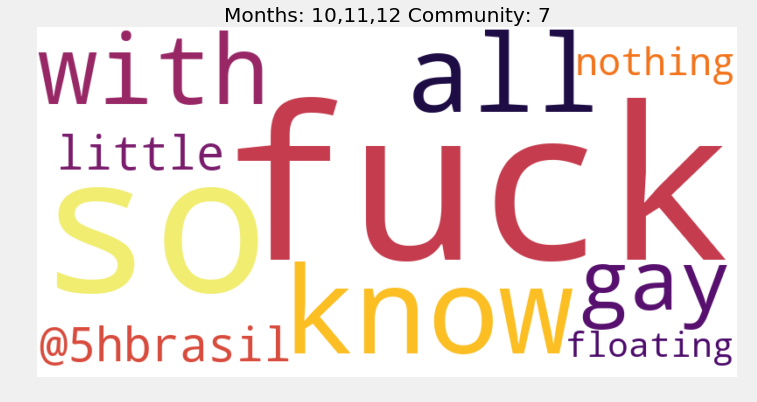

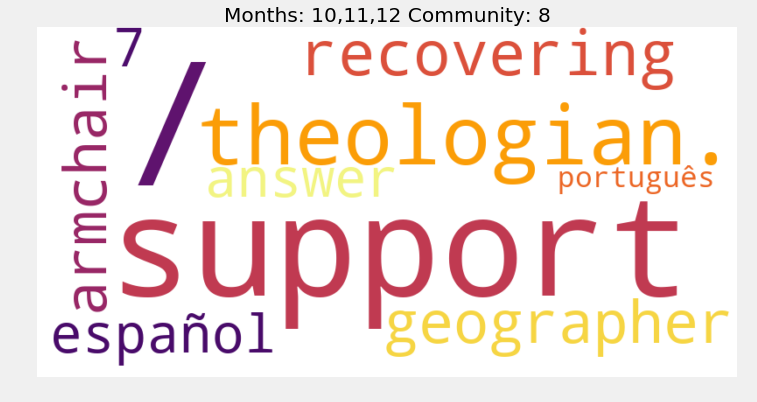

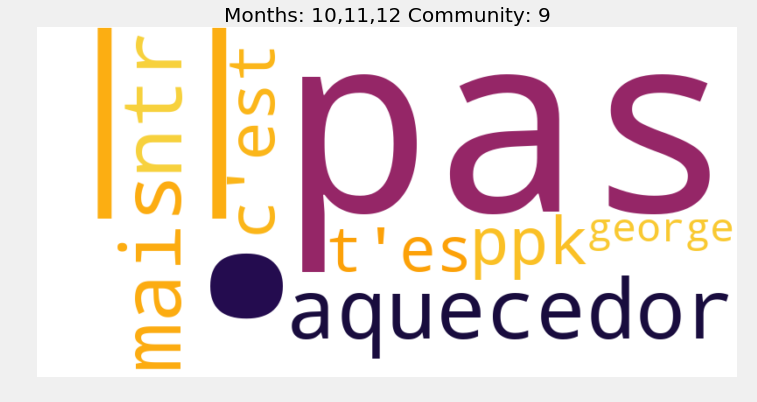

In [97]:
from __future__ import division
import string
import math
from sklearn.feature_extraction.text import TfidfVectorizer
image_path = cStringIO.StringIO(urllib.urlopen('https://i.imgur.com/kftApxC.png').read())
texas_mask = np.array(Image.open(image_path))
# defining the wordcloud with stopwords and some edgy styling choices. 

def tokenize(text):
    d = text.split('\n--------------\n')
    out = []
    for i in d:
        out+=i.split()
    return out


STOPWORDS = STOPWORDS.union({'http','https','je','la','le','les'})
for m_index, m_list in enumerate(months):
    descDict = pickle.load(open(OUTPUT_DIRECTORY + str(y) + '_' + str(m_index) + '_userDescriptions_200.cPickle'))
#     tokenize = lambda doc: doc.lower().split(" ")
    sklearn_tfidf = TfidfVectorizer(norm='l2',min_df=0, use_idf=True, smooth_idf=False, sublinear_tf=True, tokenizer=tokenize)
#     print descDict.values()
    a = sklearn_tfidf.fit(descDict.values())
    b = sklearn_tfidf.fit_transform([descDict[c] for c in range(NUMBER_OF_COMMUNITIES)])
    indexToWord = {v: k for k, v in a.vocabulary_.iteritems()}
#     print indexToWord
    for c in range(NUMBER_OF_COMMUNITIES):
        tfIdFVec = np.squeeze(b[c].toarray())
        k = tfIdFVec.argsort()[::-1][:10]
        t = dict()
        
        for f in k:
            t[indexToWord[f]] = tfIdFVec[f]
        if '' in t:
            del t['']
        
        deneme = ' '.join(t.keys()[:100])
        ohMy = txb.TextBlob(deneme)
        lang =  ohMy.detect_language() 
        if lang == 'ar':
            for i in t.keys():
                try:
                    t[get_display(i)] = t[i]
                except:
                    print 'lol'
                del t[i]
            word_cloud = WordCloud(font_path='arabtype.ttf',width=800, height=400,background_color="white", collocations=False,colormap='inferno', normalize_plurals=False)
        
        else:
             word_cloud = WordCloud(width=800, height=400,background_color="white", collocations=False,colormap='inferno', normalize_plurals=False)
        
        
        plt.figure()
        word_cloud.generate_from_frequencies(t)
        plt.imshow(word_cloud, interpolation="bilinear")
        plt.title('Months: ' +  ','.join(str(m) for m in m_list) + ' Community: ' + str(c) )
        plt.axis("off")
        plt.show()

In [33]:
import arabic_reshaper

ImportError: No module named arabic_reshaper